# Multivariate Structural Time Series

> Alexandre Andorra, Jesse Grabowski
>
> PyData Berlin 2025

<a href="https://colab.research.google.com/github/AlexAndorra/pydata-berlin-statespace-models/blob/main/notebooks/multivariate-casestudy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import sys

if 'google.colab' in sys.modules:
    !pip install git+https://github.com/pymc-devs/pymc-extras.git@main
    !pip install watermark

In [2]:
import arviz as az
import pymc_extras.statespace as pmss
import pymc as pm
import pytensor.tensor as pt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

from pymc.model.transform.optimization import freeze_dims_and_data

import preliz as pz

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [3]:
%config InlineBackend.figure_format = 'retina'

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 5]
plt.rcParams["legend.fontsize"] = 11
plt.rcParams["legend.frameon"] = True

seed = sum(map(ord, "pydata-berlin"))
rng = np.random.default_rng(seed)

In [4]:
def sampler_kwargs():
    return dict(
        nuts_sampler="nutpie",
        chains=6,
        tune=500,
        draws=500,
        nuts_sampler_kwargs={"backend": "jax", "gradient_backend": "jax"},
    )

## Test example: French Presidents' Approval

In [5]:
try:
    data = pd.read_csv("../data/popularite.csv", index_col=0).reset_index().rename(columns={"index": "date"})
except FileNotFoundError:
    URL_FILE = "https://raw.githubusercontent.com/AlexAndorra/pydata-berlin-statespace-models/refs/heads/main/data/popularite.csv"
    data = pd.read_csv(URL_FILE, index_col=0).reset_index().rename(columns={"index": "date"})

data = data[
    data.president.isin(["chirac2", "sarkozy", "hollande", "macron", "macron2"])
]  # limit to 5-year terms
data["date"] = pd.to_datetime(data["date"])
data[["day", "month", "year"]] = data["date"].apply(lambda x: pd.Series([x.day, x.month, x.year]))
data

,date,president,sondage,samplesize,method,approve_pr,disapprove_pr,day,month,year
862,2002-05-15,chirac2,Ifop,924,phone,51.0,44.0,15,5,2002
863,2002-05-20,chirac2,Kantar,972,face to face,50.0,48.0,20,5,2002
864,2002-05-23,chirac2,BVA,1054,phone,52.0,37.0,23,5,2002
865,2002-05-26,chirac2,Ipsos,907,phone,48.0,48.0,26,5,2002
866,2002-06-16,chirac2,Ifop,974,phone,49.0,43.0,16,6,2002
...,...,...,...,...,...,...,...,...,...,...
2030,2022-05-21,macron2,Ifop,1946,phone&internet,41.0,58.0,21,5,2022
2031,2022-05-25,macron2,Odoxa,1005,internet,44.0,56.0,25,5,2022
2032,2022-05-26,macron2,Harris,1002,internet,49.0,51.0,26,5,2022
2033,2022-05-30,macron2,Kantar,1000,internet,37.0,56.0,30,5,2022


### Just for testing: average over months

In [6]:
agg = data.groupby(["president", "year", "month"]).mean(numeric_only=True).reset_index()
agg["date"] = pd.to_datetime(agg[["year", "month"]].assign(DAY=1))
agg["month_id"] = (
    agg.groupby(["president"]).cumcount().to_numpy()
)  # counter for months per president
agg = (
    agg.drop(columns=["day", "month", "year", "samplesize"])
    .sort_values(["date", "president"])
    .set_index("date")
)

# scale data for Kalman filter
num_cols = ["approve_pr"]
scaled_cols = [f"{col}_scaled" for col in num_cols]
scaler = StandardScaler()
agg[scaled_cols] = scaler.fit_transform(agg[num_cols])

newterm_dates = agg.reset_index().groupby("president").first()["date"]
presidents = agg.president.unique()

agg

,president,approve_pr,disapprove_pr,month_id,approve_pr_scaled
date,,,,,
2002-05-01,chirac2,50.250000,44.250000,0,1.218260
2002-06-01,chirac2,50.500000,42.500000,1,1.240589
2002-07-01,chirac2,53.333333,40.666667,2,1.493656
2002-08-01,chirac2,52.000000,41.666667,3,1.374566
2002-09-01,chirac2,52.500000,42.000000,4,1.419225
...,...,...,...,...,...
2022-03-01,macron,44.250000,53.250000,58,0.682353
2022-04-01,macron,40.000000,59.000000,59,0.302753
2022-04-01,macron2,45.500000,54.500000,0,0.794000


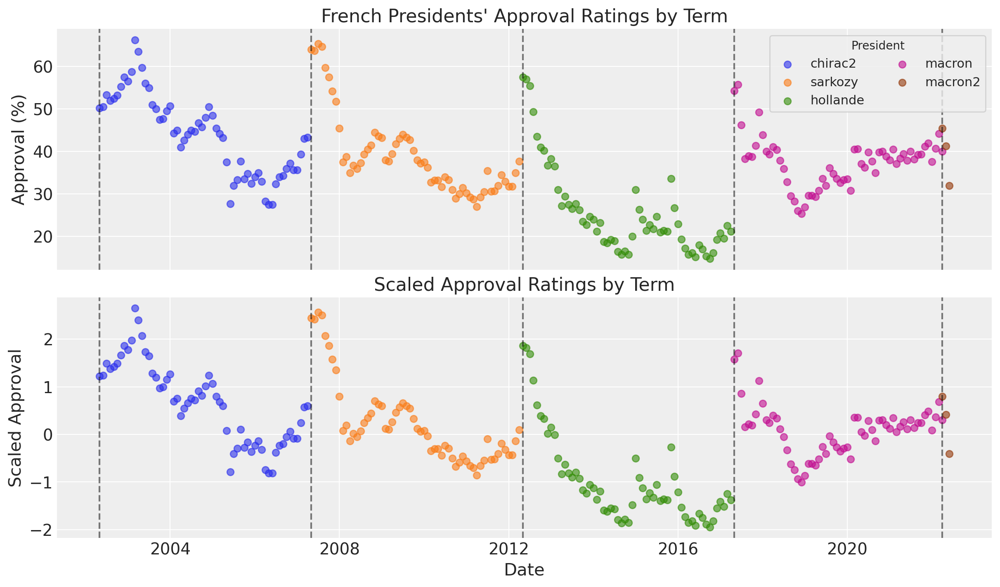

In [7]:
_, ax = plt.subplots(2, 1, sharex=True, figsize=(12, 7))

for president in presidents:
    pres_data = agg[agg["president"] == president]
    ax[0].scatter(pres_data.index, pres_data["approve_pr"], label=president, alpha=0.6)
    ax[1].scatter(pres_data.index, pres_data["approve_pr_scaled"], alpha=0.6)

for date in newterm_dates:
    ax[0].axvline(date, color="k", linestyle="--", alpha=0.5)
    ax[1].axvline(date, color="k", linestyle="--", alpha=0.5)

ax[0].set(ylabel="Approval (%)", title="French Presidents' Approval Ratings by Term")
ax[1].set(xlabel="Date", ylabel="Scaled Approval", title="Scaled Approval Ratings by Term")
ax[0].legend(title="President", ncol=2);

In [8]:
ll = pmss.structural.LevelTrendComponent(
    name="trend", order=2, innovations_order=[0, 1], observed_state_names=presidents
)
ar = pmss.structural.AutoregressiveComponent(name="ar", order=1, observed_state_names=presidents)
noise = pmss.structural.MeasurementError(
    name="noise", observed_state_names=presidents, share_states=True
)
structural_mod = (ll + ar + noise).build(mode="JAX")

                                  Model Requirements                                  
                                                                                      
  Variable        Shape      Constraints                                  Dimensions  
 ──────────────────────────────────────────────────────────────────────────────────── 
  initial_trend   (5, 2)                              ('endog_trend', 'state_trend')  
  sigma_trend     (5, 1)     Positive                 ('endog_trend', 'shock_trend')  
  params_ar       (5, 1)                                      ('endog_ar', 'lag_ar')  
  sigma_ar        (5,)       Positive                                  ('endog_ar',)  
  sigma_noise     ()         Positive                                           None  
  P0              (15, 15)   Positive semi-definite           ('state', 'state_aux')  
                                                                                      
 These parameters should be assigned priors inside a PyMC model block before calling  
                          the build_statespace_graph method.                          

#### Expected DataFrame Format
- Shape: (n_time_periods, n_variables) where:
- n_time_periods is the number of time observations
- n_variables is the number of endogenous variables (must match k_endog in your model)

**Structure**:
1. Index: Should be a time index (preferably pd.DatetimeIndex or pd.RangeIndex)
2. Columns: Each column represents one endogenous variable
3. Column names: Should match the observed_state_names specified when building your structural model

In [8]:
formatted_data = (
    agg[["month_id", "president", "approve_pr_scaled"]]
    .pivot(index="month_id", columns="president", values="approve_pr_scaled")
    .reindex(columns=presidents)
)
# assert that the columns are in the intended order and match the 'presidents' array exactly
assert list(formatted_data.columns) == list(presidents), (
    f"Column order mismatch: got {list(formatted_data.columns)}, expected {list(presidents)}"
)
formatted_data.head()

president,chirac2,sarkozy,hollande,macron,macron2
month_id,,,,,
0,1.218260,2.446379,1.865814,1.579997,0.794000
1,1.240589,2.416606,1.821155,1.707478,0.414400
2,1.493656,2.565469,1.687178,0.856523,-0.411789
3,1.374566,2.505924,1.136385,0.153890,NaN
4,1.419225,2.066779,0.615365,0.213435,NaN


In [9]:
sigma_dist = pz.maxent(pz.Gamma(), lower=0.1, upper=5, plot=False)

/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:111: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:74: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:175: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)


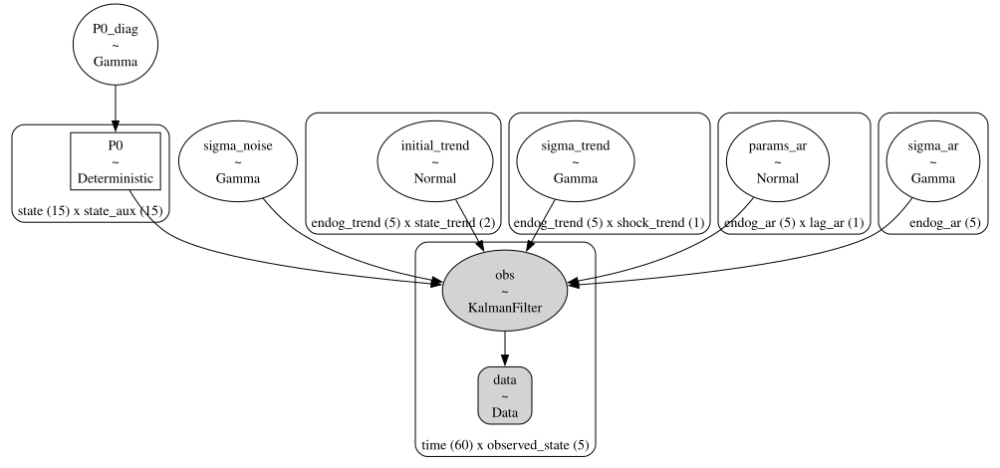

In [11]:
with pm.Model(coords=structural_mod.coords) as unpooled_model:
    P0_diag = pm.Gamma("P0_diag", alpha=5, beta=5)
    P0 = pm.Deterministic(
        "P0", pt.eye(structural_mod.k_states) * P0_diag, dims=structural_mod.param_dims["P0"]
    )

    initial_trend = pm.Normal(
        "initial_trend", sigma=0.5, dims=structural_mod.param_dims["initial_trend"]
    )
    # sigma_trend = pm.Gamma(
    #     "sigma_trend", alpha=2, beta=50, dims=structural_mod.param_dims["sigma_trend"]
    # )
    sigma_trend = sigma_dist.to_pymc("sigma_trend", dims=structural_mod.param_dims["sigma_trend"])

    # Keep the prior mass in the stationary region (-1, 1)
    params_ar = pz.maxent(pz.Normal(), lower=-0.9, upper=0.9, plot=False).to_pymc(
        "params_ar", dims=structural_mod.param_dims["params_ar"]
    )
    #params_ar = pm.Beta("params_ar", alpha=3, beta=3, dims=structural_mod.param_dims["params_ar"])
    # sigma_ar = pm.Gamma("sigma_ar", alpha=2, beta=5, dims=structural_mod.param_dims["sigma_ar"])
    sigma_ar = sigma_dist.to_pymc("sigma_ar", dims=structural_mod.param_dims["sigma_ar"])

    # sigma_noise = pm.HalfNormal("sigma_noise", sigma=0.05)
    sigma_noise = sigma_dist.to_pymc("sigma_noise")
    
    structural_mod.build_statespace_graph(formatted_data)
unpooled_model.to_graphviz()

/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:111: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:74: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:175: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)


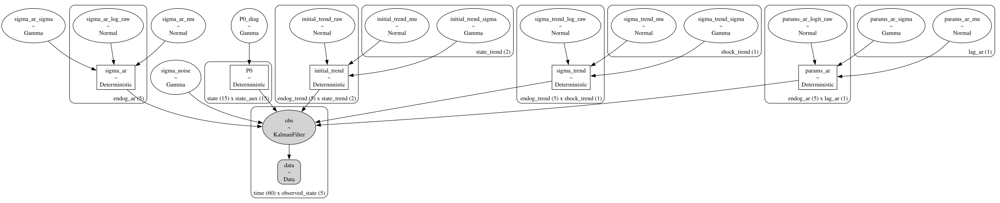

In [12]:
with pm.Model(coords=structural_mod.coords) as partial_pooled_model:
    P0_diag = pm.Gamma("P0_diag", alpha=5, beta=5)
    P0 = pm.Deterministic(
        "P0", pt.eye(structural_mod.k_states) * P0_diag, dims=structural_mod.param_dims["P0"]
    )

    initial_trend_mu = pm.Normal(
        "initial_trend_mu",
        mu=0,
        sigma=1,
        dims="state_trend",  # data is standardized
    )
    #initial_trend_sigma = pm.Gamma("initial_trend_sigma", alpha=2, beta=2, dims="state_trend")
    initial_trend_sigma = sigma_dist.to_pymc("initial_trend_sigma", dims="state_trend")
    initial_trend = pm.Deterministic(
        "initial_trend",
        initial_trend_mu
        + initial_trend_sigma
        * pm.Normal(
            "initial_trend_raw",
            dims=structural_mod.param_dims["initial_trend"],
        ),
        dims=structural_mod.param_dims["initial_trend"],
    )

    diffed_data = formatted_data.diff().to_numpy().flatten()
    sigma_trend_mu = pm.Normal(
        "sigma_trend_mu",
        mu=np.nanmean(diffed_data),
        sigma=np.nanstd(diffed_data),
        dims="shock_trend",
    )
    #sigma_trend_sigma = pm.Gamma("sigma_trend_sigma", alpha=2, beta=2, dims="shock_trend")
    sigma_trend_sigma = sigma_dist.to_pymc("sigma_trend_sigma", dims="shock_trend")
    sigma_trend = pm.Deterministic(
        "sigma_trend",
        pt.softplus(
            sigma_trend_mu
            + sigma_trend_sigma
            * pm.Normal(
                "sigma_trend_log_raw",
                dims=structural_mod.param_dims["sigma_trend"],
            )
        ),
        dims=structural_mod.param_dims["sigma_trend"],
    )

    params_ar_mu = pm.Normal("params_ar_mu", mu=0, sigma=0.1, dims="lag_ar")
    #params_ar_sigma = pm.Gamma("params_ar_sigma", alpha=2, beta=2, dims="lag_ar")
    params_ar_sigma = sigma_dist.to_pymc("params_ar_sigma", dims="lag_ar")
    params_ar = pm.Deterministic(
        "params_ar",
        pm.math.invlogit(
            params_ar_mu
            + params_ar_sigma
            * pm.Normal(
                "params_ar_logit_raw",
                dims=structural_mod.param_dims["params_ar"],
            )
        ),
        dims=structural_mod.param_dims["params_ar"],
    )

    sigma_ar_mu = pm.Normal("sigma_ar_mu", mu=0, sigma=0.1)
    #sigma_ar_sigma = pm.Gamma("sigma_ar_sigma", alpha=2, beta=2)
    sigma_ar_sigma = sigma_dist.to_pymc("sigma_ar_sigma")
    sigma_ar = pm.Deterministic(
        "sigma_ar",
        pt.softplus(
            sigma_ar_mu
            + sigma_ar_sigma
            * pm.Normal(
                "sigma_ar_log_raw",
                dims=structural_mod.param_dims["sigma_ar"],
            )
        ),
        dims=structural_mod.param_dims["sigma_ar"],
    )

    sigma_noise = sigma_dist.to_pymc("sigma_noise")

    structural_mod.build_statespace_graph(formatted_data)
partial_pooled_model.to_graphviz()

## Prior Predictive

EXPLAIN THE DIFFERENT TYPES OF PRIORS

In [14]:
with freeze_dims_and_data(partial_pooled_model):
    idata = pm.sample_prior_predictive(compile_kwargs={"mode": "JAX"})

/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pytensor/link/jax/linker.py:32: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x310BA4580>), RNG(<Generator(PCG64) at 0x31028BD80>), RNG(<Generator(PCG64) at 0x310BA4200>), RNG(<Generator(PCG64) at 0x310BA43C0>), RNG(<Generator(PCG64) at 0x31028BBC0>), RNG(<Generator(PCG64) at 0x31028BE60>), RNG(<Generator(PCG64) at 0x31028BCA0>), RNG(<Generator(PCG64) at 0x310BA4120>), RNG(<Generator(PCG64) at 0x310BA4040>), RNG(<Generator(PCG64) at 0x310C56A40>), RNG(<Generator(PCG64) at 0x31028BAE0>), RNG(<Generator(PCG64) at 0x31028B840>), RNG(<Generator(PCG64) at 0x310BA4740>), RNG(<Generator(PCG64) at 0x31028B920>), RNG(<Generator(PCG64) at 0x310BA4660>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [P0_diag, initial_trend_mu, initial_trend_raw, initial_trend_sigma, obs, params_ar_logit_raw, params_ar_mu, params_ar_sigma, sigma_ar_log_raw, sigma_ar

### Unconditional

In [15]:
# only need the following until feature is merged into pymc-extras
import types
from component_parsing import extract_components_from_idata

# bind custom function to model object
structural_mod.extract_components_from_idata = types.MethodType(extract_components_from_idata, structural_mod)

In [16]:
unconditional_prior = structural_mod.sample_unconditional_prior(idata)
unconditional_component_idata = structural_mod.extract_components_from_idata(
    unconditional_prior, restructure=True
)
unconditional_component_hdi = az.hdi(unconditional_component_idata)

/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pytensor/link/jax/linker.py:32: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x32261D1C0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [prior_combined]


Output()

Variables prior_observed do not contain all hidden states (their last dimension is not 15). They will not be present in the modified idata.


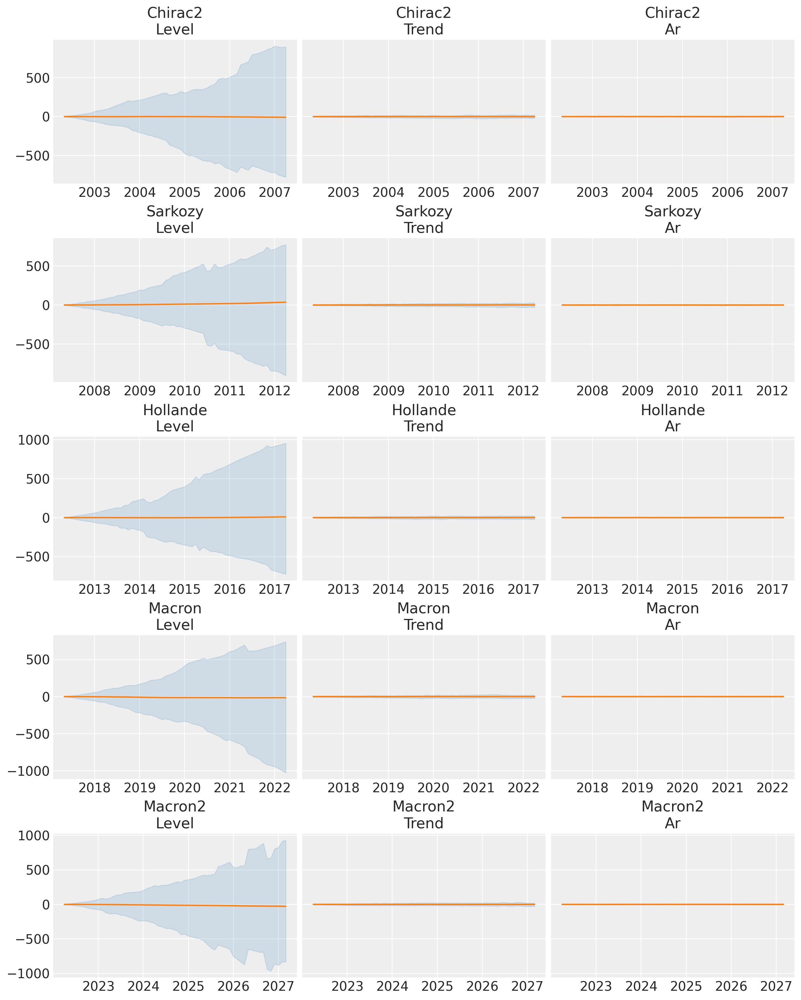

In [19]:
fig, ax = plt.subplots(5, 3, figsize=(12, 15), sharey="row", constrained_layout=True)

for row, president in enumerate(presidents):
    temp = (
        unconditional_component_idata["prior_latent"]
        .sel(observed=president)
        .stack(sample=["chain", "draw"])
    )
    for col, component in enumerate(
        pd.unique(unconditional_component_idata.coords["component"].to_pandas())
    ):
        axis = ax[row, col]
        mean = temp.sel(component=component).mean("sample")
        hdi = (
            az.hdi(temp.sel(component=component), input_core_dims=[["sample"]])["prior_latent"]
            .to_numpy()
            .T
        )
        dates = (
            agg[agg.president == president].index.to_numpy()
            if president != "macron2"
            else pd.date_range(start="2022-04-01", periods=60, freq="MS")
        )
        axis.plot(
            dates,
            mean,
            color="tab:orange",
        )
        axis.fill_between(
            dates,
            *hdi,
            color="tab:blue",
            alpha=0.15,
        )
        axis.set(title=f"{president.title()}\n{component.title()}")

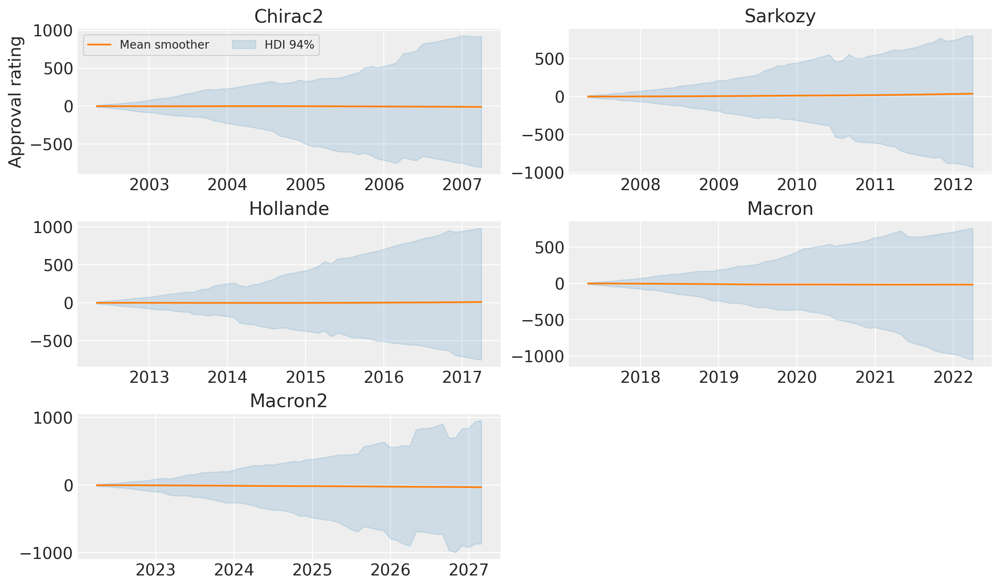

In [20]:
fig, ax = plt.subplots(3, 2, figsize=(12, 7), constrained_layout=True)
ax = ax.flatten()
ax[-1].set_visible(False)

for i, president in enumerate(presidents):
    temp = agg[agg.president == president]
    dates = (
        temp.index.to_numpy()
        if president != "macron2"
        else pd.date_range(start="2022-04-01", periods=60, freq="MS")
    )
    ax[i].plot(
        dates,
        (
            unconditional_component_idata["prior_latent"]
            .sel(observed=president)
            .sum("component")
            .mean(("chain", "draw"))
        ),
        color="tab:orange",
        label="Mean smoother",
    )
    ax[i].fill_between(
        dates,
        *unconditional_component_hdi["prior_latent"]
        .sel(observed=president)
        .sum("component")
        .to_numpy()
        .T,
        color="tab:blue",
        alpha=0.15,
        label="HDI 94%",
    )
    ax[i].set(title=f"{president.title()}")
    if i == 0:
        ax[i].set(ylabel="Approval rating")
        ax[i].legend(fontsize=10, ncol=3)

### Conditional

In [21]:
conditional_prior = structural_mod.sample_conditional_prior(idata)
conditional_component_idata = structural_mod.extract_components_from_idata(
    conditional_prior, restructure=True
)
conditional_component_hdi = az.hdi(conditional_component_idata)

/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:111: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:74: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:175: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pytensor/link/jax/linker.py:32: UserWarning: The RandomType SharedVariables [RNG(<Generat

Output()

Variables predicted_prior_observed, smoothed_prior_observed, filtered_prior_observed do not contain all hidden states (their last dimension is not 15). They will not be present in the modified idata.


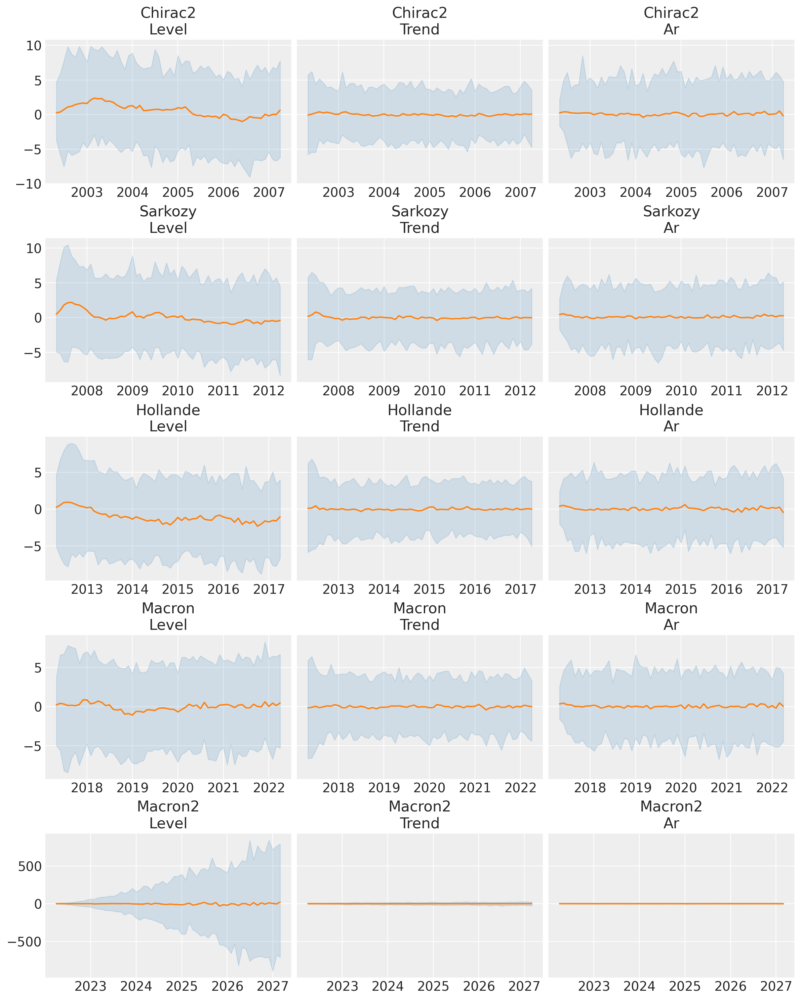

In [22]:
fig, ax = plt.subplots(5, 3, figsize=(12, 15), sharey="row", constrained_layout=True)

for row, president in enumerate(presidents):
    temp = (
        conditional_component_idata["filtered_prior"]
        .sel(observed=president)
        .stack(sample=["chain", "draw"])
    )
    for col, component in enumerate(
        pd.unique(conditional_component_idata.coords["component"].to_pandas())
    ):
        axis = ax[row, col]
        mean = temp.sel(component=component).mean("sample")
        hdi = (
            az.hdi(temp.sel(component=component), input_core_dims=[["sample"]])["filtered_prior"]
            .to_numpy()
            .T
        )
        dates = (
            agg[agg.president == president].index.to_numpy()
            if president != "macron2"
            else pd.date_range(start="2022-04-01", periods=60, freq="MS")
        )
        axis.plot(
            dates,
            mean,
            color="tab:orange",
        )
        axis.fill_between(
            dates,
            *hdi,
            color="tab:blue",
            alpha=0.15,
        )
        axis.set(title=f"{president.title()}\n{component.title()}")

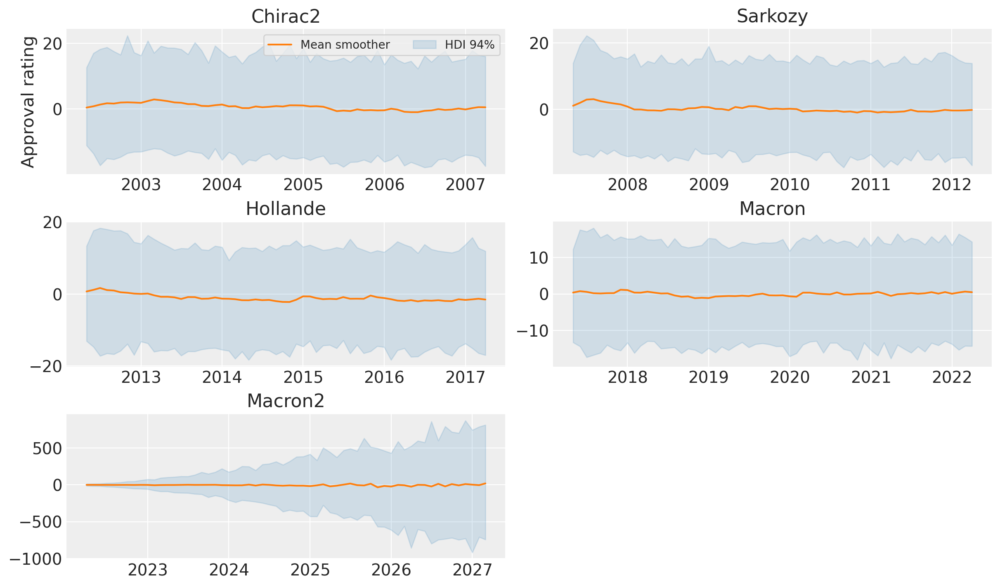

In [23]:
fig, ax = plt.subplots(3, 2, figsize=(12, 7), constrained_layout=True)
ax = ax.flatten()
ax[-1].set_visible(False)

for i, president in enumerate(presidents):
    temp = agg[agg.president == president]
    dates = (
        temp.index.to_numpy()
        if president != "macron2"
        else pd.date_range(start="2022-04-01", periods=60, freq="MS")
    )
    ax[i].plot(
        dates,
        (
            conditional_component_idata["filtered_prior"]
            .sel(observed=president)
            .sum("component")
            .mean(("chain", "draw"))
        ),
        color="tab:orange",
        label="Mean smoother",
    )
    ax[i].fill_between(
        dates,
        *conditional_component_hdi["filtered_prior"]
        .sel(observed=president)
        .sum("component")
        .to_numpy()
        .T,
        color="tab:blue",
        alpha=0.15,
        label="HDI 94%",
    )
    ax[i].set(title=f"{president.title()}")
    if i == 0:
        ax[i].set(ylabel="Approval rating")
        ax[i].legend(fontsize=10, ncol=3)

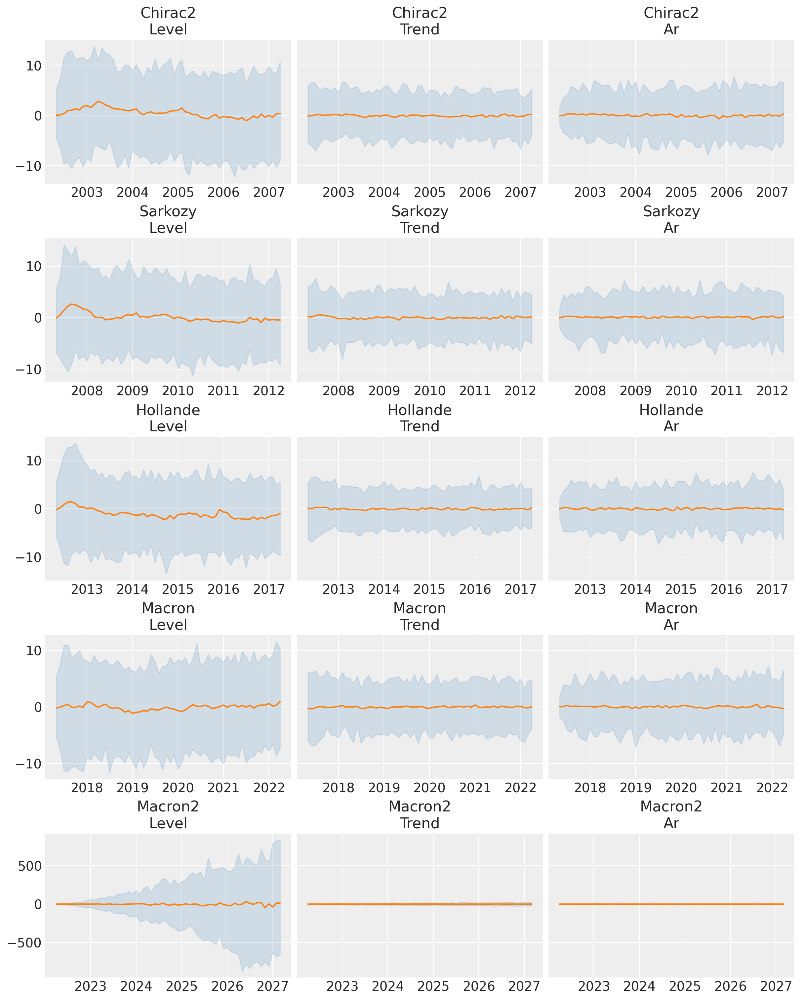

In [24]:
fig, ax = plt.subplots(5, 3, figsize=(12, 15), sharey="row", constrained_layout=True)

for row, president in enumerate(presidents):
    temp = (
        conditional_component_idata["predicted_prior"]
        .sel(observed=president)
        .stack(sample=["chain", "draw"])
    )
    for col, component in enumerate(
        pd.unique(conditional_component_idata.coords["component"].to_pandas())
    ):
        axis = ax[row, col]
        mean = temp.sel(component=component).mean("sample")
        hdi = (
            az.hdi(temp.sel(component=component), input_core_dims=[["sample"]])["predicted_prior"]
            .to_numpy()
            .T
        )
        dates = (
            agg[agg.president == president].index.to_numpy()
            if president != "macron2"
            else pd.date_range(start="2022-04-01", periods=60, freq="MS")
        )
        axis.plot(
            dates,
            mean,
            color="tab:orange",
        )
        axis.fill_between(
            dates,
            *hdi,
            color="tab:blue",
            alpha=0.15,
        )
        axis.set(title=f"{president.title()}\n{component.title()}")

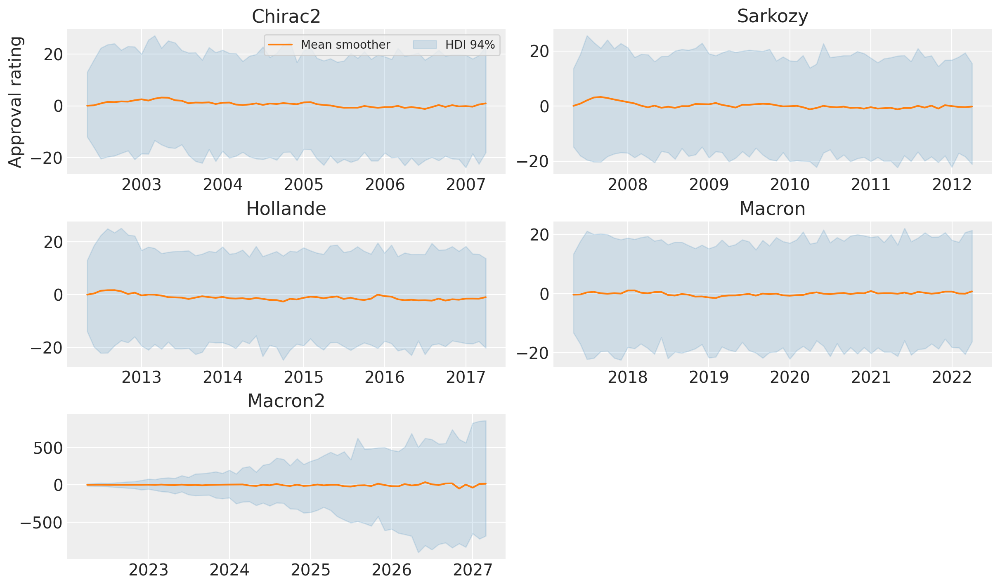

In [25]:
fig, ax = plt.subplots(3, 2, figsize=(12, 7), constrained_layout=True)
ax = ax.flatten()
ax[-1].set_visible(False)

for i, president in enumerate(presidents):
    temp = agg[agg.president == president]
    dates = (
        temp.index.to_numpy()
        if president != "macron2"
        else pd.date_range(start="2022-04-01", periods=60, freq="MS")
    )
    ax[i].plot(
        dates,
        (
            conditional_component_idata["predicted_prior"]
            .sel(observed=president)
            .sum("component")
            .mean(("chain", "draw"))
        ),
        color="tab:orange",
        label="Mean smoother",
    )
    ax[i].fill_between(
        dates,
        *conditional_component_hdi["predicted_prior"]
        .sel(observed=president)
        .sum("component")
        .to_numpy()
        .T,
        color="tab:blue",
        alpha=0.15,
        label="HDI 94%",
    )
    ax[i].set(title=f"{president.title()}")
    if i == 0:
        ax[i].set(ylabel="Approval rating")
        ax[i].legend(fontsize=10, ncol=3)

## Estimation

In [26]:
with partial_pooled_model:
    idata.extend(pm.sample(**sampler_kwargs()))

Progress,Draws,Divergences,Step Size,Gradients/Draw
,728,0,0.28,15
,686,0,0.27,15
,585,1,0.23,31
,588,0,0.25,15
,655,0,0.26,31
,620,0,0.26,31
,647,0,0.27,15
,690,0,0.25,15


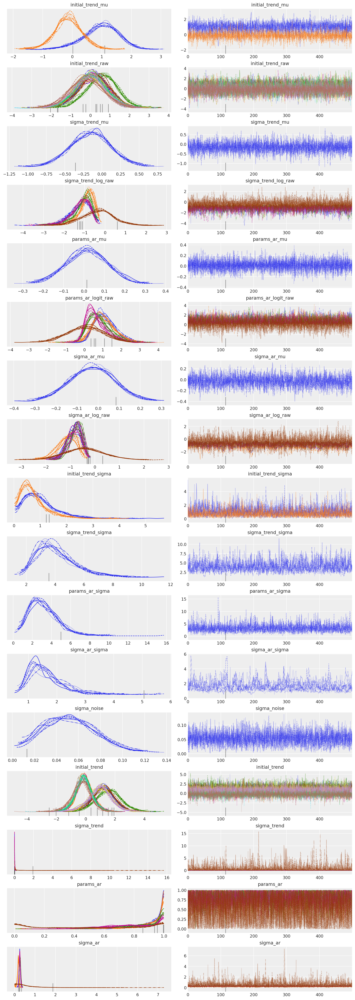

In [ ]:
az.plot_trace(idata, var_names=["~P0", "~__"], filter_vars="like");

We can start by looking at the different estimated components. There is a helper method, `extract_components_from_idata`, to grab them out of the `idata` returned by post-estimation sampling functions, such as `sample_conditional_posterior`.

In [28]:
post_pred = structural_mod.sample_conditional_posterior(idata, mvn_method="cholesky")
component_idata = structural_mod.extract_components_from_idata(post_pred, restructure=True)
component_hdi = az.hdi(component_idata)

/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:111: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:74: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:175: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pytensor/link/jax/linker.py:32: UserWarning: The RandomType SharedVariables [RNG(<Generat

Output()

Variables filtered_posterior_observed, predicted_posterior_observed, smoothed_posterior_observed do not contain all hidden states (their last dimension is not 15). They will not be present in the modified idata.


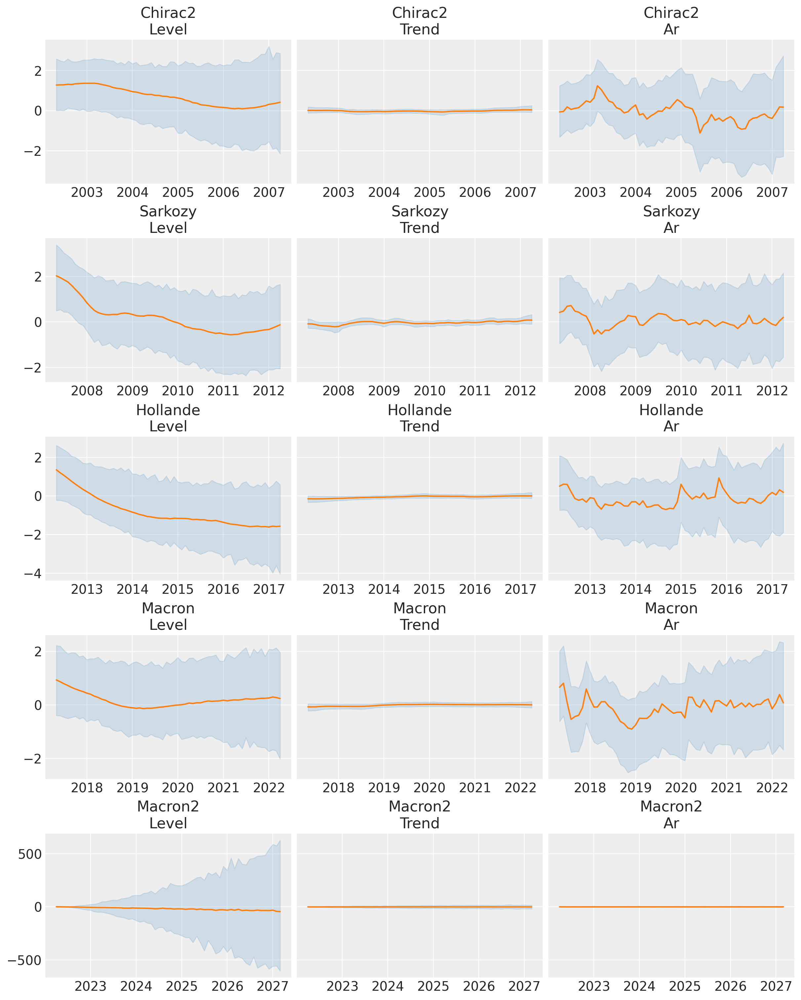

In [29]:
fig, ax = plt.subplots(5, 3, figsize=(12, 15), sharey="row", constrained_layout=True)

for row, president in enumerate(presidents):
    temp = (
        component_idata["smoothed_posterior"]
        .sel(observed=president)
        .stack(sample=["chain", "draw"])
    )
    for col, component in enumerate(pd.unique(component_idata.coords["component"].to_pandas())):
        axis = ax[row, col]
        mean = temp.sel(component=component).mean("sample")
        hdi = (
            az.hdi(temp.sel(component=component), input_core_dims=[["sample"]])[
                "smoothed_posterior"
            ]
            .to_numpy()
            .T
        )
        dates = (
            agg[agg.president == president].index.to_numpy()
            if president != "macron2"
            else pd.date_range(start="2022-04-01", periods=60, freq="MS")
        )
        axis.plot(
            dates,
            mean,
            color="tab:orange",
        )
        axis.fill_between(
            dates,
            *hdi,
            color="tab:blue",
            alpha=0.15,
        )
        axis.set(title=f"{president.title()}\n{component.title()}")

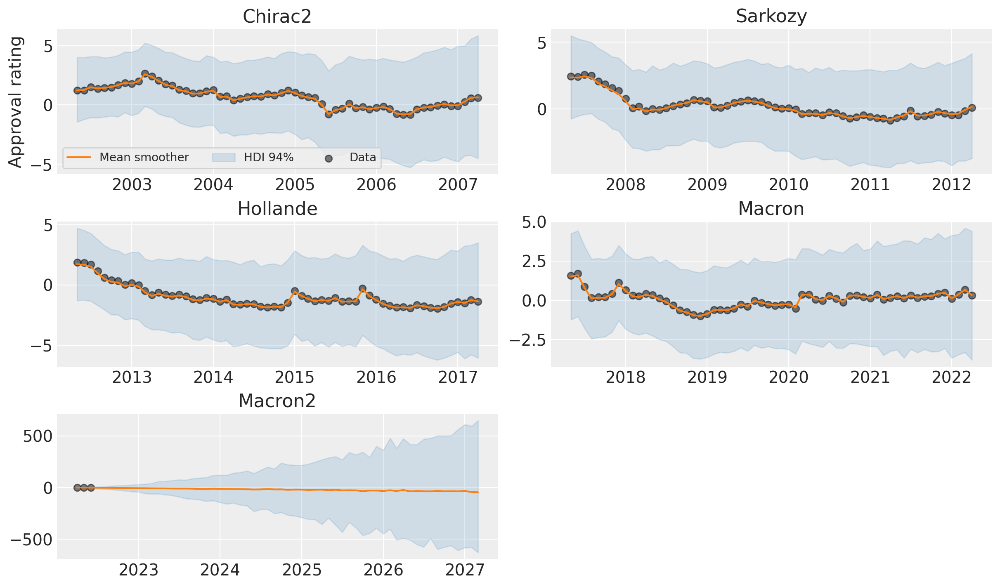

In [30]:
fig, ax = plt.subplots(3, 2, figsize=(12, 7), constrained_layout=True)
ax = ax.flatten()
ax[-1].set_visible(False)

for i, president in enumerate(presidents):
    temp = agg[agg.president == president]
    dates = (
        temp.index.to_numpy()
        if president != "macron2"
        else pd.date_range(start="2022-04-01", periods=60, freq="MS")
    )
    ax[i].plot(
        dates,
        (
            component_idata["smoothed_posterior"]
            .sel(observed=president)
            .sum("component")
            .mean(("chain", "draw"))
        ),
        color="tab:orange",
        label="Mean smoother",
    )
    ax[i].fill_between(
        dates,
        *component_hdi["smoothed_posterior"].sel(observed=president).sum("component").to_numpy().T,
        color="tab:blue",
        alpha=0.15,
        label="HDI 94%",
    )
    ax[i].scatter(
        temp.index,
        temp["approve_pr_scaled"],
        color="k",
        alpha=0.5,
        label="Data",
    )
    ax[i].set(title=f"{president.title()}")
    if i == 0:
        ax[i].set(ylabel="Approval rating")
        ax[i].legend(fontsize=10, ncol=3)

Macron's second term is really weird (note the y-axis scale), but that's because forecasting out that far is meaningless: the prediction errors just blow up, which is inevitable: forcasting errors will always scale with $\sqrt{T}$, because it's an autoregressive process.

Ideally, we'd forecast one period out (here, that'd be one month out), because once we get new data, we can update and make a new forecast. But, if our colleagues need a year-out-forecast, we wouldn't recommend to forecast a daily model for 365 days for example; rather, we'd aggregate the data up, sample the new model, and still do one period out.

That being said, since you're so special, let's make a 12-month forecast, just to show you.

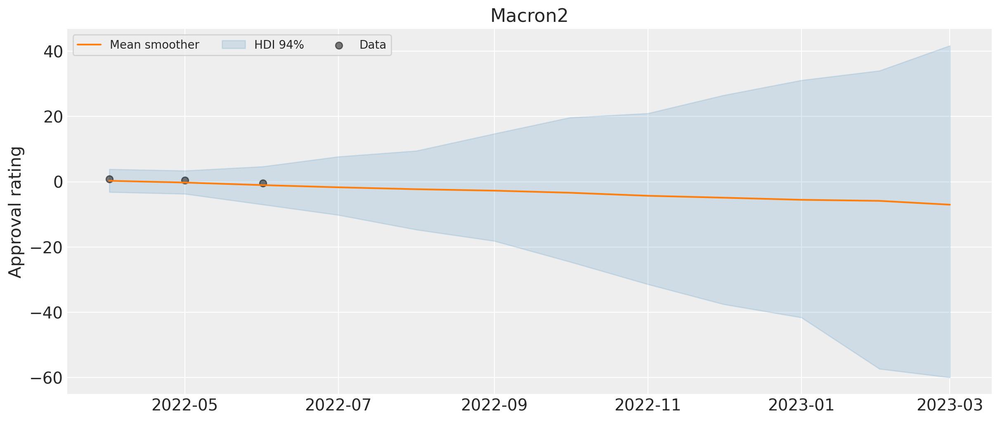

In [31]:
temp = agg[agg.president == president].iloc[:12]
dates = pd.date_range(start="2022-04-01", periods=12, freq="MS")
_, ax = plt.subplots()
ax.plot(
    dates,
    (
        component_idata["smoothed_posterior"]
        .sel(observed=president, time=slice(0, 11))
        .sum("component")
        .mean(("chain", "draw"))
    ),
    color="tab:orange",
    label="Mean smoother",
)
ax.fill_between(
    dates,
    *component_hdi["smoothed_posterior"]
    .sel(observed=president, time=slice(0, 11))
    .sum("component")
    .to_numpy()
    .T,
    color="tab:blue",
    alpha=0.15,
    label="HDI 94%",
)
ax.scatter(
    temp.index,
    temp["approve_pr_scaled"],
    color="k",
    alpha=0.5,
    label="Data",
)
ax.set(title=f"{president.title()}")
ax.set(ylabel="Approval rating")
ax.legend(fontsize=10, ncol=3);

### Porcupine Graph

A "porcupine graph" shows model forecasts at different periods in the time series. The name comes from the fact that forecasts lines poke out from the data like porcupine quills. We make one for this data to show the flexibility of the forecast method.

This isn't a true porcupine graph though, because the "forecasts" for the in-sample period are generated using parameters fit on data from the future. As noted, it's just a nice demonstration of the forecast method.

In [32]:
import warnings

idatas = []
for month in formatted_data["macron"].iloc[10::10].index.to_numpy():
    with warnings.catch_warnings():
        # silence the PyMC warning about JAX shared variables
        warnings.simplefilter("ignore")
        idata_forecast = structural_mod.forecast(
            idata,
            start=month,
            periods=5,
            filter_output="smoothed",
        )
    idatas.append(idata_forecast)

Sampling: [forecast_combined]


Output()

Sampling: [forecast_combined]


Output()

Sampling: [forecast_combined]


Output()

Sampling: [forecast_combined]


Output()

Sampling: [forecast_combined]


Output()

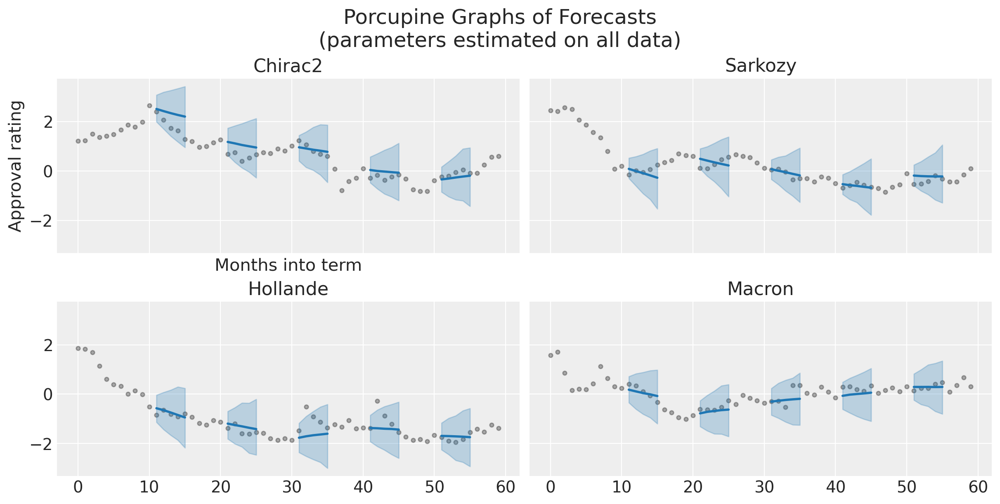

In [33]:
fig, ax = plt.subplots(2, 2, figsize=(12, 6), constrained_layout=True, sharex=True, sharey=True)
fig.suptitle("Porcupine Graphs of Forecasts\n(parameters estimated on all data)", fontsize=18)
ax = ax.flatten()

for i, president in enumerate(presidents[:-1]):
    temp = agg[agg.president == president]
    ax[i].scatter(
        temp["month_id"],
        temp["approve_pr_scaled"],
        color="k",
        alpha=0.3,
        s=12,
    )

    for idata_forecast in idatas:
        forecast = az.extract(idata_forecast.sel(observed_state=president))
        hdi_forecast = az.hdi(idata_forecast.sel(observed_state=president))["forecast_observed"]
        mean = forecast.mean("sample")["forecast_observed"]
        mean.plot.line(x="time", color="tab:blue", lw=2, ax=ax[i])
        ax[i].fill_between(
            hdi_forecast.coords["time"].to_numpy(),
            *hdi_forecast.to_numpy().T,
            color="tab:blue",
            alpha=0.25,
        )
    ax[i].set(title=f"{president.title()}", xlabel="", ylabel="")
    if i == 0:
        ax[i].set(xlabel="Months into term", ylabel="Approval rating")

## Exogenous regressors



Now, let's load up the __quarterly unemployment rate__ in France, downloaded from [the French statistical office](https://www.insee.fr/fr/statistiques/serie/001688526#Telechargement).
As this variable is usually well correlated with politicians' and parties' popularity, we will use it as a predictor in our model.

We're computing the popularity every month, but since unemployment data are released quarterly, we just forward-fill the unemployment values when they are missing. We could also forecast unemployment first in this model, and then pass this as a random variable to our second time series model, but let's keep this simple, shall we?

To demonstrate how to use binary predictors, we'll create one that's flagging the __budget season__: The French government's annual budget announcement typically happens in early October each year. This schedule gives Parliament 70 days to debate and adopt the budget before the end of the year, which puts budgeting issues (and trade-offs) front and center in the news cycle, potentially affecting presidents' popularity. As a result, we create a flag that's on for each year's September, October and November, to capture the duration of potential effects.

Here is the data:

In [10]:
try:
    unemployment_data = pd.read_csv("../data/unemployment.csv", sep=";", header=0, names=["quarter", "unemployment"], usecols=[0, 1])
except FileNotFoundError:
    URL_FILE = "https://raw.githubusercontent.com/AlexAndorra/pydata-berlin-statespace-models/refs/heads/main/data/unemployment.csv"
    unemployment_data = pd.read_csv(URL_FILE, sep=";", header=0, names=["quarter", "unemployment"], usecols=[0, 1])

unemployment_data["quarter"] = (
    pd.period_range(start="1975Q1", end="2025Q2", freq="Q")[::-1]
    .to_timestamp(how="end")
    .normalize()
)
unemployment_data = unemployment_data.set_index("quarter").sort_index()

unemp_scaler = StandardScaler()
unemployment_data["unemployment_scaled"] = unemp_scaler.fit_transform(unemployment_data["unemployment"].to_numpy().reshape(-1, 1))

# merge using most recent unemployment value avadtable at or before each polling date
# need to do for each president to avoid duplicate dates
agg_with_exog = []
for president, group in agg.groupby("president", sort=False):
    group = group.copy()
    group["unemployment_scaled"] = (
        unemployment_data["unemployment_scaled"]
        .reindex(unemployment_data.index.union(group.index))
        .ffill()
        .reindex(group.index)
    )
    agg_with_exog.append(group)
agg_with_exog = pd.concat(agg_with_exog).sort_index()

agg_with_exog["budget_season"] = agg_with_exog.index.month.isin([9, 10, 11]).astype(int)
agg_with_exog

,president,approve_pr,disapprove_pr,month_id,approve_pr_scaled,unemployment_scaled,budget_season
date,,,,,,,
2002-05-01,chirac2,50.250000,44.250000,0,1.218260,-0.316009,0
2002-06-01,chirac2,50.500000,42.500000,1,1.240589,-0.316009,0
2002-07-01,chirac2,53.333333,40.666667,2,1.493656,-0.316009,0
2002-08-01,chirac2,52.000000,41.666667,3,1.374566,-0.316009,0
2002-09-01,chirac2,52.500000,42.000000,4,1.419225,-0.316009,1
...,...,...,...,...,...,...,...
2022-03-01,macron,44.250000,53.250000,58,0.682353,-0.496500,0
2022-04-01,macron,40.000000,59.000000,59,0.302753,-0.556663,0
2022-04-01,macron2,45.500000,54.500000,0,0.794000,-0.556663,0


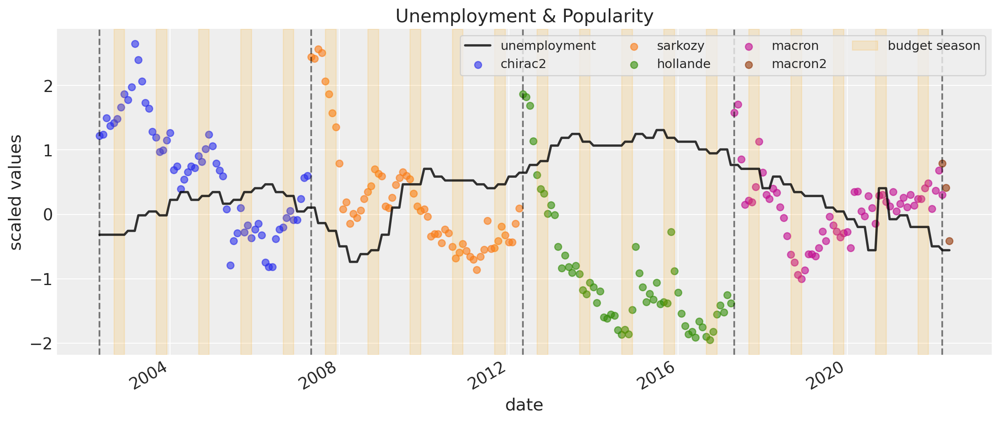

In [11]:
ax = agg_with_exog["unemployment_scaled"].plot(
    title="Unemployment & Popularity", ylabel="scaled values", label="unemployment", color="black",
    linewidth=2, alpha=0.8,
)
for president in presidents:
    pres_data = agg_with_exog.query("president == @president")
    ax.scatter(pres_data.index, pres_data["approve_pr_scaled"], alpha=0.6, label=president)

for date in newterm_dates:
    ax.axvline(date, color="k", linestyle="--", alpha=0.5)

# add a vertical band for each year's budget season
years = agg_with_exog.index.year.unique()
for year in years:
    start = pd.Timestamp(year=year, month=9, day=1)
    end = pd.Timestamp(year=year, month=12, day=1)
    # only add if range overlaps with data
    if (start <= agg_with_exog.index.max()) and (end >= agg_with_exog.index.min()):
        ax.axvspan(start, end, color="orange", alpha=0.15, label="budget season" if year == years[0] else None)
ax.legend(ncol=4);

In [12]:
budget_season_data = agg_with_exog.query("president == 'chirac2'")[["month_id", "budget_season"]].set_index("month_id")

unemp_data = (
    agg_with_exog[["month_id", "president", "unemployment_scaled"]]
    .pivot(index="month_id", columns="president", values="unemployment_scaled")
    .reindex(columns=presidents)
)
# can't have NaN covariates
# TODO: REPLACE BY GRW
unemp_data = unemp_data.ffill()
# assert that the columns are in the intended order and match the 'presidents' array exactly
assert list(unemp_data.columns) == list(presidents), (
    f"Column order mismatch: got {list(unemp_data.columns)}, expected {list(presidents)}"
)
unemp_data.head()

president,chirac2,sarkozy,hollande,macron,macron2
month_id,,,,,
0,-0.316009,0.105138,0.646611,0.766939,-0.556663
1,-0.316009,0.105138,0.646611,0.766939,-0.556663
2,-0.316009,-0.135517,0.766939,0.706775,-0.556663
3,-0.316009,-0.135517,0.766939,0.706775,-0.556663
4,-0.316009,-0.135517,0.766939,0.706775,-0.556663


In [14]:
exog_mod = pmss.structural.LevelTrendComponent(
    name="trend", order=2, innovations_order=1, observed_state_names=presidents
)
exog_mod += pmss.structural.AutoregressiveComponent(
    name="ar", order=1, observed_state_names=presidents
)
exog_mod += pmss.structural.RegressionComponent(
    state_names=presidents, name="unemp", observed_state_names=presidents, share_states=False,
)
exog_mod += pmss.structural.RegressionComponent(
    state_names=["budget"], name="budget", observed_state_names=presidents, share_states=True,
)
exog_mod += pmss.structural.MeasurementError(
    name="noise", observed_state_names=presidents, share_states=True
)
exog_mod = exog_mod.build(mode="JAX")

                                  Model Requirements                                   
                                                                                       
  Variable        Shape       Constraints                                  Dimensions  
 ───────────────────────────────────────────────────────────────────────────────────── 
  initial_trend   (5, 2)                               ('endog_trend', 'state_trend')  
  sigma_trend     (5, 1)      Positive                 ('endog_trend', 'shock_trend')  
  params_ar       (5, 1)                                       ('endog_ar', 'lag_ar')  
  sigma_ar        (5,)        Positive                                  ('endog_ar',)  
  beta_unemp      (5, 5)                               ('endog_unemp', 'state_unemp')  
  beta_budget     (1,)                                              ('state_budget',)  
  sigma_noise     ()          Positive                                           None  
  P0              (41, 41)    Positive semi-definite           ('state', 'state_aux')  
                                                                                       
  data_unemp      (None, 5)   pm.Data                         ('time', 'state_unemp')  
  data_budget     (None, 1)   pm.Data                        ('time', 'state_budget')  
                                                                                       
These parameters should be assigned priors inside a PyMC model block before calling the
                            build_statespace_graph method.                             

/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:111: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:74: UserWarning: No time index found on the supplied data. A simple range index will be automatically generated.
  warnings.warn(NO_TIME_INDEX_WARNING)
/Users/aandorra/miniforge3/envs/pydata-ssm/lib/python3.13/site-packages/pymc_extras/statespace/utils/data_tools.py:175: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
python(63205) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


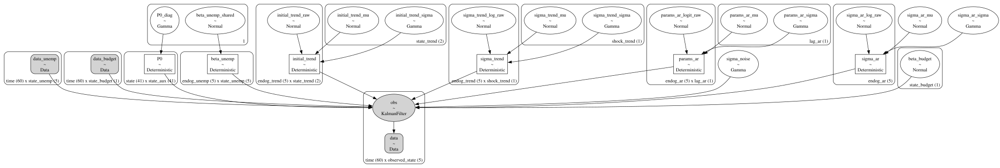

In [19]:
with pm.Model(coords=exog_mod.coords) as exog_reg_model:
    _ = pm.Data("data_unemp", unemp_data, dims=["time", "state_unemp"])
    _ = pm.Data("data_budget", budget_season_data, dims=["time", "state_budget"])
    
    P0_diag = pm.Gamma("P0_diag", alpha=5, beta=5, shape=(1,))
    P0 = pm.Deterministic(
        "P0", pt.eye(exog_mod.k_states) * P0_diag, dims=exog_mod.param_dims["P0"],
    )

    initial_trend_mu = pm.Normal(
        "initial_trend_mu",
        mu=0,
        sigma=1,
        dims="state_trend",  # data is standardized
    )
    initial_trend_sigma = sigma_dist.to_pymc("initial_trend_sigma", dims="state_trend")
    initial_trend = pm.Deterministic(
        "initial_trend",
        initial_trend_mu
        + initial_trend_sigma
        * pm.Normal(
            "initial_trend_raw",
            dims=exog_mod.param_dims["initial_trend"],
        ),
        dims=exog_mod.param_dims["initial_trend"],
    )

    diffed_data = formatted_data.diff().to_numpy().flatten()
    sigma_trend_mu = pm.Normal(
        "sigma_trend_mu",
        mu=np.nanmean(diffed_data),
        sigma=np.nanstd(diffed_data),
        dims="shock_trend",
    )
    sigma_trend_sigma = sigma_dist.to_pymc("sigma_trend_sigma", dims="shock_trend")
    sigma_trend = pm.Deterministic(
        "sigma_trend",
        pt.softplus(
            sigma_trend_mu
            + sigma_trend_sigma
            * pm.Normal(
                "sigma_trend_log_raw",
                dims=exog_mod.param_dims["sigma_trend"],
            )
        ),
        dims=exog_mod.param_dims["sigma_trend"],
    )

    params_ar_mu = pm.Normal("params_ar_mu", mu=0, sigma=0.1, dims="lag_ar")
    params_ar_sigma = sigma_dist.to_pymc("params_ar_sigma", dims="lag_ar")
    params_ar = pm.Deterministic(
        "params_ar",
        pm.math.invlogit(
            params_ar_mu
            + params_ar_sigma
            * pm.Normal(
                "params_ar_logit_raw",
                dims=exog_mod.param_dims["params_ar"],
            )
        ),
        dims=exog_mod.param_dims["params_ar"],
    )

    sigma_ar_mu = pm.Normal("sigma_ar_mu", mu=0, sigma=0.1)
    sigma_ar_sigma = sigma_dist.to_pymc("sigma_ar_sigma")
    sigma_ar = pm.Deterministic(
        "sigma_ar",
        pt.softplus(
            sigma_ar_mu
            + sigma_ar_sigma
            * pm.Normal(
                "sigma_ar_log_raw",
                dims=exog_mod.param_dims["sigma_ar"],
            )
        ),
        dims=exog_mod.param_dims["sigma_ar"],
    )

    beta_unemp_shared = pm.Normal("beta_unemp_shared", sigma=0.5, shape=(1,)) # one slope for all president
    beta_unemp = pm.Deterministic(
        "beta_unemp",
        pt.eye(len(presidents)) * beta_unemp_shared,
        dims=exog_mod.param_dims["beta_unemp"],
    )

    beta_budget = pm.Normal("beta_budget", sigma=0.5, dims=exog_mod.param_dims["beta_budget"])

    sigma_noise = sigma_dist.to_pymc("sigma_noise")

    exog_mod.build_statespace_graph(formatted_data)
exog_reg_model.to_graphviz()

In [20]:
with exog_reg_model:
    idata_reg = pm.sample(**sampler_kwargs())

python(63495) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63504) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Progress,Draws,Divergences,Step Size,Gradients/Draw
,66,0,0.08,63
,45,0,0.09,127
,65,0,0.06,127
,49,0,0.14,63
,66,0,0.28,15
,71,0,0.38,15


In [ ]:
az.plot_trace(idata_reg, var_names=["~P0", "~__"], filter_vars="like");

## VARMAX

In [ ]:
# TODO
# - var_model = pmss.BayesianVARMAX()
#
# ets_mod = pmss.BayesianETS(
#     order=("A", "N", "N"),
#     endog_names=presidents,
#     dense_innovation_covariance=True,
#     stationary_initialization=True,
# )
#
# sarima_mod = pmss.BayesianSARIMA(order=(3, 0, 0), batch_coords={"president": presidents})

### Real use case

In [ ]:
data["month_id"] = np.hstack(
    [
        pd.Categorical(data[data.president == president]["date"].dt.to_period("M")).codes
        for president in data.president.unique()
    ]
)
months = np.arange(max(data["month_id"]) + 1)

In [ ]:
data

,date,president,sondage,samplesize,method,approve_pr,disapprove_pr,day,month,year,month_id
862,2002-05-15,chirac2,Ifop,924,phone,51.0,44.0,15,5,2002,0
863,2002-05-20,chirac2,Kantar,972,face to face,50.0,48.0,20,5,2002,0
864,2002-05-23,chirac2,BVA,1054,phone,52.0,37.0,23,5,2002,0
865,2002-05-26,chirac2,Ipsos,907,phone,48.0,48.0,26,5,2002,0
866,2002-06-16,chirac2,Ifop,974,phone,49.0,43.0,16,6,2002,1
...,...,...,...,...,...,...,...,...,...,...,...
2030,2022-05-21,macron2,Ifop,1946,phone&internet,41.0,58.0,21,5,2022,1
2031,2022-05-25,macron2,Odoxa,1005,internet,44.0,56.0,25,5,2022,1
2032,2022-05-26,macron2,Harris,1002,internet,49.0,51.0,26,5,2022,1
2033,2022-05-30,macron2,Kantar,1000,internet,37.0,56.0,30,5,2022,1


In [ ]:
COORDS = {
    "month": months,
    # each observation is uniquely identified by (pollster, field_date):
    "observation": data.set_index(["sondage", "date"]).index,
}

In [ ]:
mod = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
mod += st.AutoregressiveComponent(order=1)
mod += st.MeasurementError(name="obs")